In [6]:
import sys
sys.path.append("../dataset/")

import datetime
import glob
import json
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import nrrd
import numpy as np

from dataset import UltraSoundImages
from utils import *

In [7]:
original_map = mcolors.LinearSegmentedColormap.from_list('original_mask', [(0, (0,0,0,0)), (1, 'yellow')])
pred_map = mcolors.LinearSegmentedColormap.from_list('pred_mask', [(0, (0,0,0,0)), (1, 'red')])

In [35]:
dataset_type = 'samsung'
image_gen_shape = (320, 320, 1)
batch_size = 8
nfold = 4
fold_id = 1
augment = True

In [44]:
def plot_batch(images, masks):
    plt.figure(figsize=(16, 8))
    i = 1
    for image, mask in zip(images, masks):
        plt.subplot(2, 4, i)
        plt.imshow(image)
        plt.imshow(mask, alpha=0.5, cmap=original_map)
        plt.title(f'Przykład nr {i}')
        i += 1

In [37]:
samsung_gen, _, _ = get_dataset(dataset_type, batch_size, image_gen_shape, augment, nfold=nfold, fold_id=fold_id)

Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading


In [38]:
images, masks = samsung_gen.__getitem__(1, augment=False)

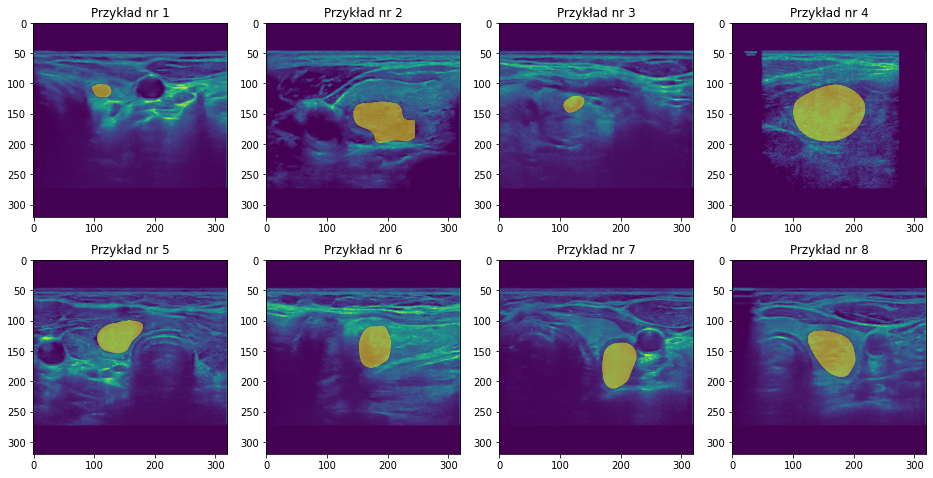

In [45]:
plot_batch(images, masks)

In [46]:
images, masks = samsung_gen.__getitem__(1, augment=True)

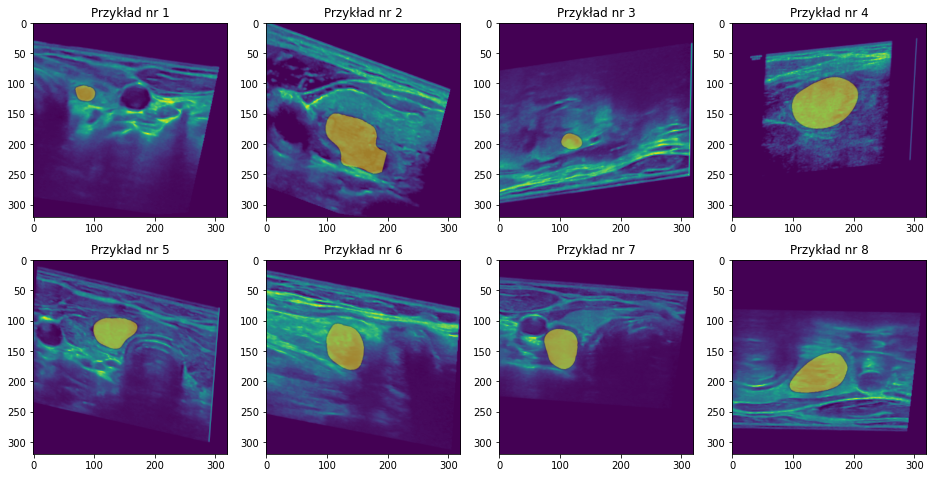

In [47]:
plot_batch(images, masks)

In [49]:
dataset_type = 'ge'

In [50]:
ge_gen, _, _ = get_dataset('ge', batch_size, image_gen_shape, augment, nfold=nfold, fold_id=fold_id)

Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading


In [51]:
images, masks = ge_gen.__getitem__(1, augment=False)

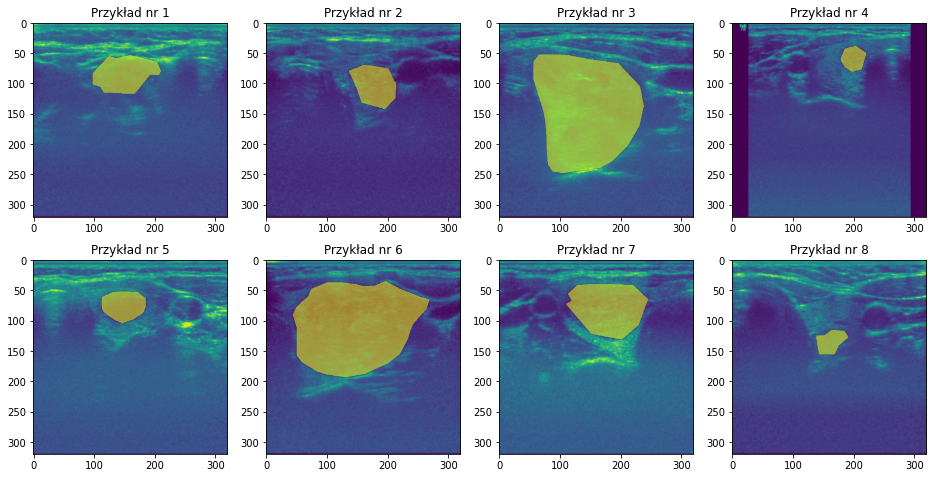

In [52]:
plot_batch(images, masks)

In [55]:
images, masks = ge_gen.__getitem__(1)

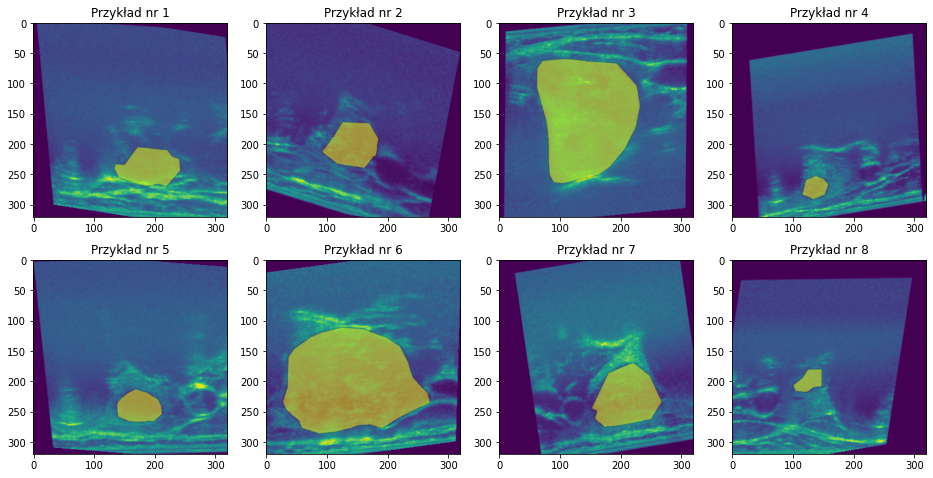

In [56]:
plot_batch(images, masks)

In [4]:
import glob
import nrrd
import random
import tensorflow_addons as tfa
import tensorflow as tf
import numpy as np
from tensorflow.keras.utils import Sequence
import matplotlib.pyplot as plt
import os

In [26]:
SAMSUNG_MASK_NORM = 15555.0
GA_MASK_NORM = 255.0


class UltraSoundImages(Sequence):
    """Helper to iterate over the data (as Numpy arrays)."""

    def __init__(self, batch_size, raw_images_paths, raw_masks_paths, dataset_type='ge', augment=True, random_crop=False, size=None, shuffle=True):
        self.MAX_SHARPNESS_LEVEL = 5
        self.MIN_CONTRAST_ADJUSTMENT = 0
        self.MAX_CONTRAST_ADJUSTMENT = 2.5
        self.MAX_NOISE_SCALE = 4
        self.ROTATION_RANGE = 15
        
        self.random_crop = random_crop
        self.shuffle = shuffle
        self.batch_size = batch_size
        self.augment = augment
        self.images = []
        self.masks = []
        self.dataset_type = dataset_type
        
        if self.dataset_type == 'samsung':
            self.mask_normalizer = SAMSUNG_MASK_NORM
        else:
            self.mask_normalizer = GA_MASK_NORM

        self.miscellaneous_process = [
            self.sharpen,
            self.adjust_contrast,
            self.adjust_brightness,
            self.add_noise,
            self.gaussian_filter,
        ]
        
        # Image and mask have to be stacked
        self.geometric_process = [
            self.zoom,
            self.flip,
            self.rotate, 
            self.shear,
            # self.random_crop,
        ]
        
        
        print('Loading images from NRRD format and resizing')
        for i in range(len(raw_images_paths)):
            image, header = nrrd.read(raw_images_paths[i])
            mask, header = nrrd.read(raw_masks_paths[i])
            
            if size and not self.random_crop:
                image = tf.image.resize_with_pad(image, size[0], size[1])
                mask = tf.image.resize_with_pad(mask, size[0], size[1])
                
            if self.dataset_type=='ge':
                image = np.expand_dims(image[:,:,0], 2)
                mask = np.expand_dims(mask[:,:,0] , 2)
                
            if self.dataset_type=='mix':
                if mask.shape[2] == 3:
                    image = np.expand_dims(image[:,:,0], 2)
                    mask = np.expand_dims(mask[:,:,0] , 2)
                    mask = mask / GA_MASK_NORM
                else:
                    mask = mask / SAMSUNG_MASK_NORM
                image = image / 255
                    
            # self.images.append(tf.convert_to_tensor(list(image)) / 255 )
            # self.masks.append(tf.convert_to_tensor(list(mask)) / 255)
            
            self.images.append(image)
            self.masks.append(mask)
        print('Finished loading')

    def __len__(self):
        return len(self.masks) // self.batch_size
    
    def __getitem__(self, idx, augment=True):
        """Returns tuple (input, target) correspond to batch #idx."""
        
        # Reshuffle dataset before each epoch
        if self.shuffle and idx==0:
            seed = random.randint(0, 2047)
            random.seed(seed)
            random.shuffle(self.images)
            random.seed(seed)
            random.shuffle(self.masks)
        
        i = idx * self.batch_size
        output_images = self.images[i : i + self.batch_size]
        output_masks = self.masks[i : i + self.batch_size]
        
        if self.augment and augment:
            output_images, output_masks = self._augment_batch(output_images, output_masks)
           
        
        output_images, output_masks = np.array(output_images), np.array(output_masks)            
        # output_images, output_masks = np.array(output_images) / 255, np.array(output_masks) / self.mask_normalizer
        
        return np.array(output_images), np.array(output_masks)
        # return tf.convert_to_tensor(output_images, np.float32), tf.convert_to_tensor(output_masks)
    
    def show_sample(self):
        images, masks = self.__getitem__(0)

        i = 0
        plt.figure(figsize=(15, 15))
        for image, mask in zip(images, masks):
            plt.subplot(2, 2, i + 1)
            plt.imshow(image)
            plt.imshow(mask, alpha=0.5)
            plt.axis('off')
            i+=1
        plt.show()
        
    def test_augmentation(self, show_mask=True):
        images, masks = self.__getitem__(0)
        
        image, mask = images[0], masks[0]
        org_image = np.array(image, copy=True)
        org_mask = np.array(mask, copy=True)
        aug_image, aug_mask = self._augment(image, mask)
        
        plt.figure(figsize=(15,15))
        plt.subplot(2,1,1)
        plt.imshow(org_image)
        if show_mask:
            plt.imshow(org_mask, alpha=0.5)
        plt.subplot(2,1,2)
        plt.imshow(aug_image)
        if show_mask:
            plt.imshow(aug_mask, alpha=0.5)
        plt.axis('off')
        plt.show()
    
    
    def _augment_batch(self, images, masks):
        for i in range(len(images)):
            images[i], masks[i] = self._augment(images[i], masks[i])
        return images, masks
    
    def _augment(self, image, mask):
        
        # TODO -> Chose random proc from misc
        # And then perform all geo procs
        # for proc in self.miscellaneous_process:
        #     image, mask = proc(image, mask)
            
#         misc_proc = random.choice(self.miscellaneous_process)
#         image, mask = misc_proc(image, mask)
            
        image, mask = np.array(image), np.array(mask)
        stacked = tf.stack([image.squeeze(), mask.squeeze()])
        for proc in self.geometric_process:
            stacked = proc(stacked)
            
        stacked = np.expand_dims(stacked, 3)
        return stacked
        return tf.unstack(stacked, axis=2)
    
    # MIDCELLANEOUS TRANSFORMATIONS
    def sharpen(self, image, mask):
        level = random.random() * self.MAX_SHARPNESS_LEVEL
        sharpened = tfa.image.sharpness(image, level)
        return sharpened, mask
    
    def adjust_contrast(self, image, mask):
        adjusted = tf.image.random_contrast(image, self.MIN_CONTRAST_ADJUSTMENT, self.MAX_CONTRAST_ADJUSTMENT)
        return adjusted, mask
    
    def adjust_brightness(self, image, mask):
        level = random.random() * 0.5 - 0.1
        bright = tf.image.adjust_brightness(image, level)
        return bright, mask
    
    def add_noise(self, image, mask):
        noise = np.random.normal(size=image.shape, scale=self.MAX_NOISE_SCALE)
        return image+noise, mask
    
    def gaussian_filter(self, image, mask):
        filtered = tfa.image.gaussian_filter2d(image)
        return filtered, mask

    
    # GEOMETRIC
    def flip(self, stacked):
        stacked = tf.stack(tf.unstack(stacked, axis=0), axis=2)
        
        stacked = tf.image.random_flip_left_right(stacked)
        stacked = tf.image.random_flip_up_down(stacked)
        
        stacked = tf.stack(tf.unstack(stacked, axis=2))
        return stacked
    
    def rotate(self, stacked):
        rotated = tf.keras.preprocessing.image.random_rotation(
            stacked,
            self.ROTATION_RANGE,
            fill_mode='constant',
        )
        return rotated
    
    def zoom(self, stacked):
        zoomed = tf.keras.preprocessing.image.random_zoom(
            stacked,
            # 1.5,
            [0.8, 1.2],
            fill_mode='constant',
        )
        return zoomed
    
    def shear(self, stacked):
        sheard = tf.keras.preprocessing.image.random_shear(
            stacked,
            10,
            fill_mode='constant',
        )
        return sheard
    
    # Probably not needed anymore, since other methods perform similar task
    def random_crop(self, image, mask):
        stacked_image = tf.stack([image, mask], axis=0)
        cropped_image = tf.image.random_crop(stacked_image, size=[2, 450, 450, 1])
        cropped_image, cropped_mask = cropped_image
        return cropped_image, cropped_mask
    
    
    
class Dataset:
    
    def __init__(self, kfold=4):
        pass
    
    def get_fold(self, fold_id):
        pass
    
    def _load_dataset(self):
        pass

In [27]:
SEED = 42

def get_dataset(dataset_type, batch_size, image_gen_shape, augment, nfold=None, fold_id=None, blacklist=None):
    
    # dirname = os.path.dirname(__file__)
    samsung_directory = os.path.join('../dataUSGthyroid/samsung_processed')
    ge_directory = os.path.join('../dataUSGthyroid/GE_processed')
    
    samsung_images_paths = sorted(glob.glob(samsung_directory+"/images"+'**/*', recursive=True))
    samsung_masks_paths = sorted(glob.glob(samsung_directory+"/masks"+'**/*', recursive=True))
    
    ge_images_paths = sorted(glob.glob(ge_directory+"/images"+'**/*', recursive=True))
    ge_masks_paths = sorted(glob.glob(ge_directory+"/masks"+'**/*', recursive=True))
    
    samsung_blacklist = [2089146, 2110713, 2096868, 441540, 2090807, 
                         2090038, 2091948, 935892, 2058398, 2096659]
    
    ge_blacklist = [2052396,  258419,   96874, 1869459,  176349, 2057199, 2056390,
                     65544,  129178, 1898379,  278956,   58865, 2060219,  984089,
                   1294777, 2058490,   56112, 1465881, 1645263, 1894479, 1990099,
                   2064524, 2056143,  122356, 2056594,  367643,  441046, 2056262,
                   1800412,  408920, 2044607, 2058919, 2057976, 2054476,   72899,
                   1232907, 2057729, 2052805, 2049987, 2058083, 1821959, 2039592,
                   2055940, 2049948, 1514002,  430336, 2058336, 2047914, 1987859,
                    962421, 2058232, 2067865,  178682, 2041545,  570138, 1837579,
                   1792356, 1777697,  112232, 2050494,    5450, 2066129, 2067891,
                   1962159, 2058436, 2054920,   19254, 2042518, 2058860,  102497,
                     91963,  333089, 2058455,  312222, 2062047,  294453,  102701,
                   2056173, 2058964, 2058198, 2040985, 2057821, 2059885, 2057144,
                   1982360, 2008804,  147452, 1021419, 2055255, 1496522,  451543,
                   1907420,   90321, 2063236, 1108818,  181555,  260856, 2057879,
                   2055091, 2052986, 2057487, 2045037, 2059137, 2014206, 1377277,
                   2057571, 2057492, 1782753, 2057712,   63919,   26417,   47541,
                   2044639,  551887, 2057834, 1049978, 1964701,  330193,  266298,
                   2047732,   62201, 2056549,  116261,  285541,   94531, 2063459,
                   2048695,  433001,  364011,  644500, 1861159, 2055603,  787850,
                   1443201, 2059268,   64233, 2058493,   68565,   94443, 2060236,
                   2046446, 2057718,   70279,  172572, 2055787,  613693,  711736,
                   1826726, 1814795, 2045927,  108849, 2059940, 2061524,    5226,
                   1244313, 2057039, 2055248,  983846, 2057623,  480077,   27478,
                   2055404, 2048935, 2045932,  931471, 2057795, 1489281, 2044710]

    samsung_images_paths = _shuffle_list(_filter_paths(samsung_images_paths, samsung_blacklist), SEED)
    samsung_masks_paths = _shuffle_list(_filter_paths(samsung_masks_paths, samsung_blacklist), SEED)
    
    ge_images_paths = _shuffle_list(_filter_paths(ge_images_paths, ge_blacklist), SEED)
    ge_masks_paths = _shuffle_list(_filter_paths(ge_masks_paths, ge_blacklist), SEED)
    
    if len(samsung_images_paths) > len(ge_images_paths):
        max_n_of_files = len(ge_images_paths)
        samsung_images_paths = samsung_images_paths[:max_n_of_files]
        samsung_masks_paths = samsung_masks_paths[:max_n_of_files]
        
    if dataset_type == 'samsung':
        images_paths, masks_paths = samsung_images_paths, samsung_masks_paths
    elif dataset_type == 'ge':
        images_paths, masks_paths = ge_images_paths, ge_masks_paths
    elif dataset_type == 'mix':
        s_train_images, s_train_masks, s_val_images, s_val_masks, s_test_images, s_test_masks = _split_paths(samsung_images_paths, samsung_masks_paths, nfold, fold_id, test_size=64)
        g_train_images, g_train_masks, g_val_images, g_val_masks, g_test_images, g_test_masks = _split_paths(ge_images_paths, ge_masks_paths, nfold, fold_id, test_size=64)
        
        size = len(ge_images_paths) // 2
        
        # Half Samsung, Half GE and sorted again
        train_images = _shuffle_list(s_train_images[:size] + g_train_images[:size], SEED)
        train_masks = _shuffle_list(s_train_masks[:size] + g_train_masks[:size], SEED)
        
        val_images = _shuffle_list(s_val_images[:size] + g_val_images[:size], SEED)
        val_masks = _shuffle_list(s_val_masks[:size] + g_val_masks[:size], SEED)
        
        test_images = _shuffle_list(s_test_images[:size] + g_test_images[:size], SEED)
        test_masks = _shuffle_list(s_test_masks[:size] + g_test_masks[:size], SEED)
        
    else:
        raise Exception('Sorry, there is no dataset type called: ' + dataset_type)
    # print(f'Dataset length: {len(masks_paths)}')

    if dataset_type != 'mix':
        train_images, train_masks, val_images, val_masks, test_images, test_masks = _split_paths(images_paths, masks_paths, nfold, fold_id, test_size=64)

    train_gen = UltraSoundImages(batch_size, train_images, train_masks, size=image_gen_shape, dataset_type=dataset_type, augment=augment)
    val_gen = UltraSoundImages(batch_size, val_images, val_masks, size=image_gen_shape, dataset_type=dataset_type, augment=augment)
    test_gen = UltraSoundImages(batch_size, test_images, test_masks, size=image_gen_shape, dataset_type=dataset_type, augment=augment)
    
    return train_gen, val_gen, test_gen


def _shuffle_list(lst, seed):
    random.seed(seed)
    random.shuffle(lst)
    return lst


def _split_paths(images, masks, n_fold, fold_id, test_size):
    total_samples = len(images)
    test_end_index = test_size

    test_images = images[:test_end_index]
    test_masks = masks[:test_end_index]

    train_images = images[test_end_index:]
    train_masks = masks[test_end_index:]

    total_train_samples = len(train_images)
    fold_size = total_train_samples // n_fold
    start_index = fold_id * fold_size
    end_index = start_index + fold_size

    val_images = train_images[start_index:end_index]
    val_masks = train_masks[start_index:end_index]

    train_images_fold = train_images[:start_index] + train_images[end_index:]
    train_masks_fold = train_masks[:start_index] + train_masks[end_index:]

    return train_images_fold, train_masks_fold, val_images, val_masks, test_images, test_masks



def _filter_paths(paths, blacklist):
    new_paths = []
    for path in paths:
        file_id = path.split('/')[-1].split('_')[0]
        if int(file_id) not in blacklist:
            new_paths.append(path)
    return new_paths

In [ ]:
train_gen, val_gen, test_gen = get_dataset('mix', batch_size=32, image_gen_shape=(320, 320, 1), augment=True, nfold=4, fold_id=0)

Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading
Loading images from NRRD format and resizing
Finished loading


In [29]:
images, masks = val_gen.__getitem__(0)

In [30]:
np.max(images)

0.9847587

In [31]:
np.min(images)

0.0

In [32]:
np.max(masks)

1.0

In [33]:
np.min(masks)

0.0

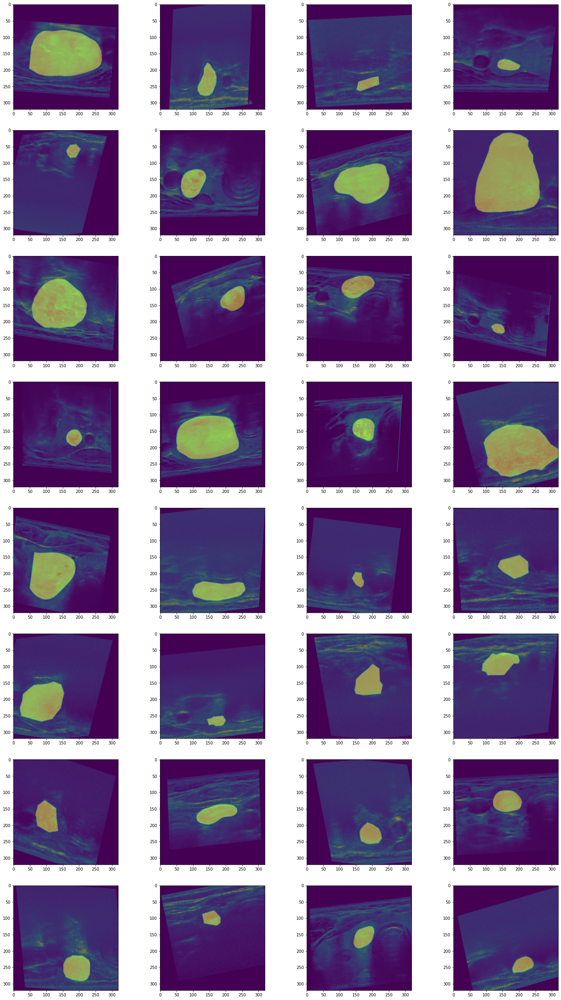

In [34]:
plt.figure(figsize=(25, 45))
i=1
for image, mask in zip(images, masks):
    plt.subplot(8, 4, i)
    plt.imshow(image)
    plt.imshow(mask, alpha=0.5)
    i += 1

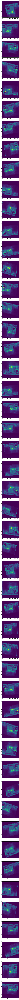

In [21]:
plt.figure(figsize=(12, 250))
images, masks = val_gen.__getitem__(1)
for i in range(50):
    plt.subplot(50, 1, i+1)
    images, masks = val_gen.__getitem__(1)
    plt.imshow(images[0])
# plt.imshow(masks[0], alpha=0.5)

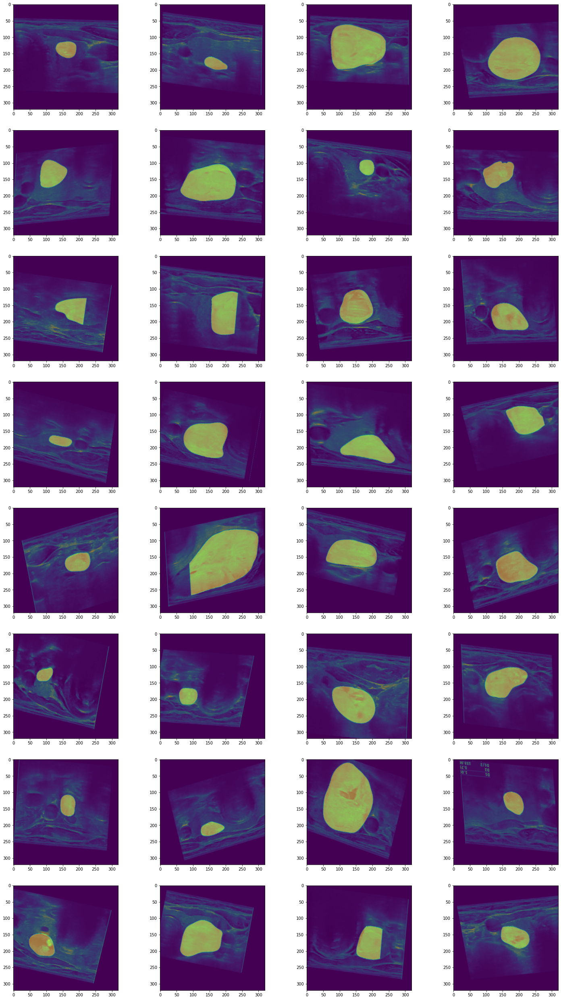

In [10]:
plt.figure(figsize=(25, 45))
i=1
for image, mask in zip(images, masks):
    plt.subplot(8, 4, i)
    plt.imshow(image)
    plt.imshow(mask, alpha=0.5)
    i += 1

In [1]:
import glob
import nrrd
import random
import tensorflow_addons as tfa
import tensorflow as tf
import numpy as np
from tensorflow.keras.utils import Sequence
import matplotlib.pyplot as plt


In [2]:
from dataset.dataset import UltraSoundImages

In [82]:
size = tf.convert_to_tensor([12, 10])
size

<tf.Tensor: shape=(2,), dtype=int32, numpy=array([12, 10], dtype=int32)>

In [10]:
# tfa.image.sharpness(gen.images[0], 4)

In [3]:
raw_dir = "RawUSGimagesNRRD"
raw_images = raw_dir + "/data_output"
raw_masks = raw_dir + "/masks"

raw_images_paths = sorted(glob.glob(raw_images + '**/*', recursive=True))[:5]
raw_masks_paths = sorted(glob.glob(raw_masks + '**/*', recursive=True))[:5]

size=(512, 512)
# size=None
gen = UltraSoundImages(4, raw_images_paths, raw_masks_paths, size=size)

# gen.test_augmentation(show_mask=False)

Loading images from NRRD format and resizing
Finished loading


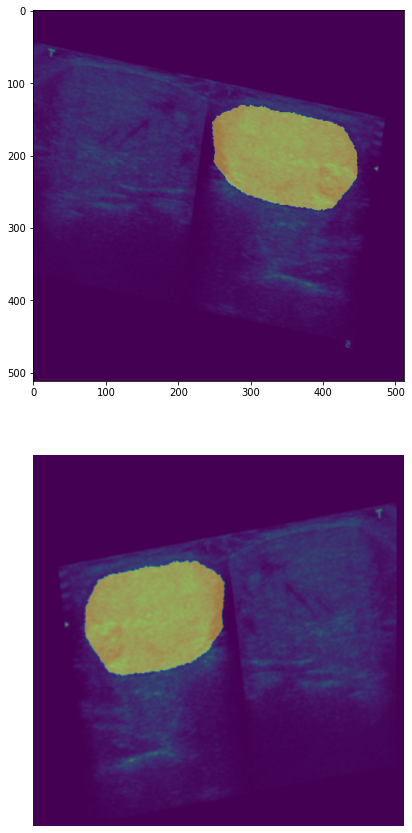

In [39]:
gen.test_augmentation(show_mask=True)

In [7]:
raw_dir = "RawUSGimagesNRRD"
raw_images = raw_dir + "/data_output"
raw_masks = raw_dir + "/masks"

raw_images_paths = sorted(glob.glob(raw_images + '**/*', recursive=True))
raw_masks_paths = sorted(glob.glob(raw_masks + '**/*', recursive=True))

images, masks = [], []
for i in range(len(raw_images_paths)):
    image, header = nrrd.read(raw_images_paths[i])
    mask, header = nrrd.read(raw_masks_paths[i])
    images.append(image)
    masks.append(mask)

In [18]:
image.shape

(309, 384, 1)

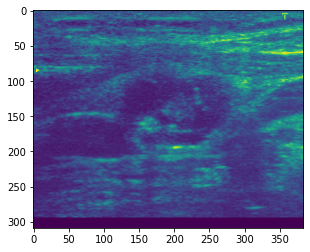

In [19]:
plt.imshow(image)
plt.show()

In [26]:
cropped_image = tf.image.random_crop(image, size=[300, 300, 1])

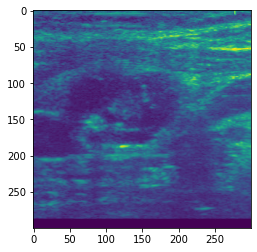

In [36]:
cropped_image = tf.image.random_crop(image, size=[300, 300, 1])
plt.imshow(cropped_image)
plt.show()

In [41]:
widths, heights, ratios = [], [], []
for image in images:
    height, width, _ = image.shape
    widths.append(width)
    heights.append(height)
    ratios.append(width/height)

(412, 512, 1)


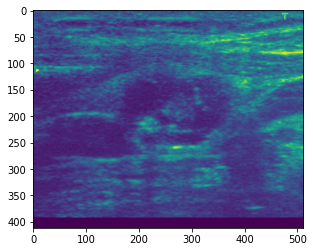

In [52]:
# height, width, _ = image.shape

resized = tf.image.resize(image, (512, 512), preserve_aspect_ratio=True) 
print(resized.shape)
plt.imshow(resized)
plt.show()

In [21]:
max(widths)

497

In [22]:
max(heights)

309

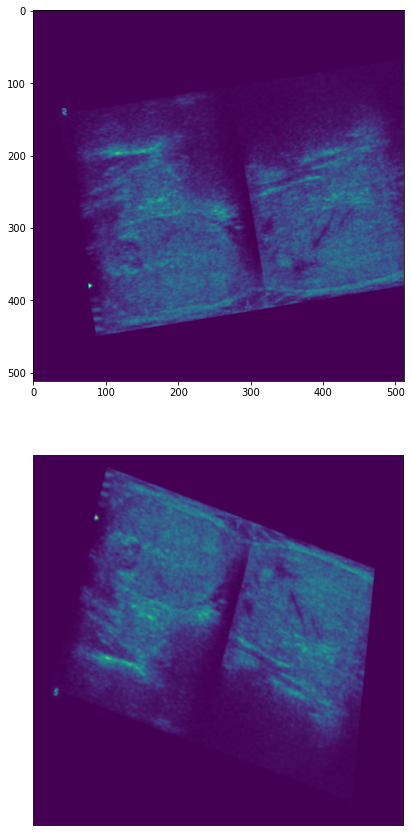

In [4]:
gen.test_augmentation(show_mask=False)

In [5]:
images, masks = gen.__getitem__(0)

type(images)
images.shape

# imgs = np.expand_dims(images, axis=3)
# img.shape
# tf.image.resize_with_pad(img, 512, 512)

(4, 512, 512, 1)

In [ ]:
imgs = np.array(gen.images).squeeze()
msks = np.array(gen.masks).squeeze()

stacked = tf.stack([imgs, msks], axis=3)
stacked.shape

# imgs = gen.images

In [ ]:
datagen = tf.keras.preprocessing.image.ImageDataGenerator(rotation_range=90, zoom_range=[0.5,1.0])
# prepare iterator
it = datagen.flow(stacked, batch_size=1)

plt.figure(figsize=(25,25))
for i in range(9):
    # define subplot
    plt.subplot(330 + 1 + i)
    # generate batch of images
    batch = it.next()
    # convert to unsigned integers for viewing
    stacked = batch[0].astype('uint8')
    image, mask = tf.unstack(stacked, axis=2)
    
    # plot raw pixel data
    plt.imshow(image)
    plt.imshow(mask, alpha=0.5)
# show the figure
plt.show()

In [5]:
images, masks = gen.__getitem__(0)

In [8]:
img = images[0]
msk = masks[0].squeeze()

zoomed = tf.keras.preprocessing.image.random_zoom(
            img,
            # 1.5,
            [0.99999, 0.99999],
            fill_mode='constant',
        )

plt.figure(figsize=(15,15))
plt.imshow(zoomed)
# plt.imshow(aug_mask, alpha=0.5)
plt.axis('off')
plt.show()

ValueError: Expected homogeneous transformation matrix with shape (2, 2) for image shape (512,), but bottom row was not equal to [0, 1]

In [9]:
new_img = np.expand_dims(image[0], axis=0)
new_img.shape

NameError: name 'image' is not defined

/tmp/ipykernel_323/3367652244.py:59: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(output_images), np.array(output_masks)


<class 'numpy.ndarray'>


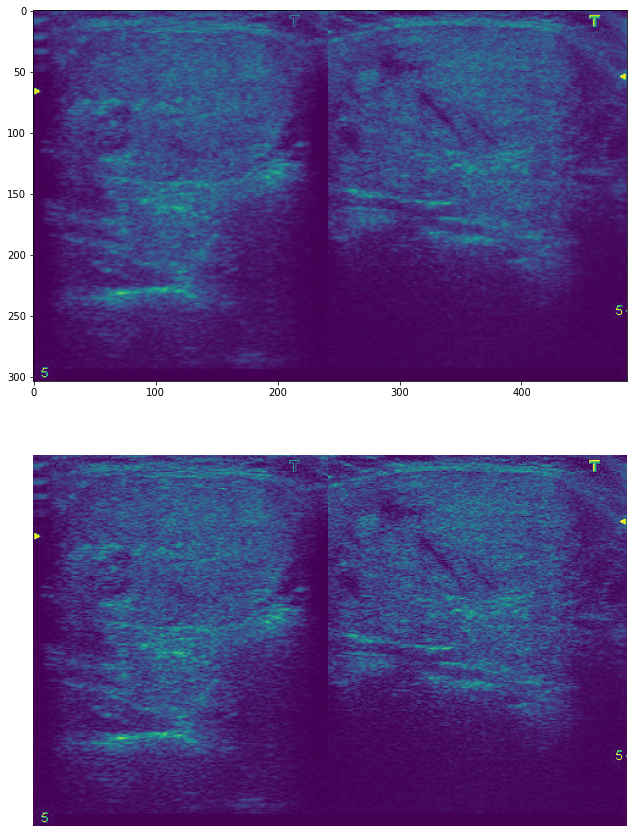

In [170]:
def sharpen(image, mask):
    # sharpened = tf.image.adjust_contrast(image, 2)
    sharpened = tfa.image.sharpness(image, 3)

    return sharpened, mask

show_mask = False

images, masks = gen.__getitem__(0)
image, mask = images[0], masks[0]
print(type(image))
aug_image, aug_mask = sharpen(image, mask)

# print(aug_image)

plt.figure(figsize=(15,15))
plt.subplot(2,1,1)
plt.imshow(image)
if show_mask:
    plt.imshow(mask, alpha=0.5)
plt.subplot(2,1,2)
plt.imshow(aug_image)
if show_mask:
    plt.imshow(aug_mask, alpha=0.5)
plt.axis('off')
plt.show()

# aug_image